In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [ ]:
from numpy.random import rand
import numpy as np
np.random.seed(0)

In [2]:
from numpy.random import random_sample
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
import lime
import lime.lime_tabular
import pandas as pd
import sklearn.datasets as datasets
from IPython.display import Image

In [21]:
from data import *
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [17]:
from numpy.random import rand
import numpy as np
from sklearn.preprocessing import MinMaxScaler
np.random.seed(0)

noise_factor = 0
input_dimension = 50000
max_possible = 10

def exp(x1, x2):
    return x1*x2 + x2*x1


def generate_data():
    indep = np.multiply(max_possible,  rand(input_dimension, 10))
#     x1 = indep[0]
#     x2 = 2 * x1 + noise_factor * rand(input_dimension)
#     x3 = 0.25 * x1 + noise_factor * rand(input_dimension)
#     correlated = np.array([x1,x2,x3])
#     non_corr = indep[1:]
#     res = np.concatenate((correlated, non_corr), axis=0)
    return indep

def real_y(x, max_possible=max_possible):
    res = 0
    for i in range(0, len(x), 2):
#         print(x[i], x[i+1], x[i] * x[i+1])
        if (x[i] * x[i+1]) > 0.2 * (max_possible**2):
            res += exp(x[i], x[i+1])
    return res

def test_log(x1, x2):
    return x2 * np.log(x1) + x1 * np.log(x2)



X = generate_data()
X.shape

y = [real_y(x) for x in X]
print(np.average(y))
y_avg =  1 * np.average(y)
y = [1 if x > y_avg else 0 for x in y]
print(np.average(y))

X = MinMaxScaler().fit_transform(X)

dim = X.shape[1]

207.87524420085114
0.47636


In [5]:
url = 'data/adult.data'
url_test = 'data/adult.test'

# load  the training data from 
train_data = pd.read_csv(url,
                         header=None,
                         names=['age', 'workclass','fnlwgt','education','education_num','maritalstatus',
                                'occupation','relationship','race','sex','capital_gain','capital_loss',
                                'hours_per_week','native_country', 'income'],
                         na_values = ' ?')
train_data.head()


# load  the training data from 
test_data = pd.read_csv(url_test,
                         header=None,
                         names=['age', 'workclass','fnlwgt','education','education_num','maritalstatus',
                                'occupation','relationship','race','sex','capital_gain','capital_loss',
                                'hours_per_week','native_country', 'income'],
                         na_values = ' ?')
test_data.head()

,age,workclass,fnlwgt,education,education_num,maritalstatus,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,|1x3 Cross validator,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,25,Private,226802.0,11th,7.0,Never-married,Machine-op-inspct,Own-child,Black,Male,0.0,0.0,40.0,United-States,<=50K.
2,38,Private,89814.0,HS-grad,9.0,Married-civ-spouse,Farming-fishing,Husband,White,Male,0.0,0.0,50.0,United-States,<=50K.
3,28,Local-gov,336951.0,Assoc-acdm,12.0,Married-civ-spouse,Protective-serv,Husband,White,Male,0.0,0.0,40.0,United-States,>50K.
4,44,Private,160323.0,Some-college,10.0,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688.0,0.0,40.0,United-States,>50K.


In [6]:
# for now just test the continous variables
test_data = test_data[['age', 'fnlwgt', 'education_num','capital_gain', 'capital_loss', 'hours_per_week','income']]
train_data = train_data[test_data.columns]

In [7]:
def preprocess_data(data, y_label='income'):
    ''' Change the categorical columns to numeric '''
    data = data.dropna()
    data = data.drop_duplicates()
    for column in data.columns:
        if data[column].dtype == object:
            data[column] = data[column].astype('category').cat.codes
    return data.drop(y_label, axis=1), data[y_label]

In [8]:
X_train, Y_train = preprocess_data(train_data)
X_test, Y_test = preprocess_data(test_data)

In [9]:
show_data = pd.read_csv("../data/no_show_dataset.csv")
show_data, show_data_labels = preprocess_data(show_data, y_label='show')

In [10]:
show_data.head()

,especialidad,edad,sexo,reserva_mes_d,reserva_mes_c,reserva_dia_d,reserva_dia_c,reserva_hora_d,reserva_hora_c,creacion_mes_d,creacion_mes_c,creacion_dia_d,creacion_dia_c,creacion_hora_d,creacion_hora_c,latencia,canal,tipo
0,76,66,1,1,0.87,1,0.62,18,0.00,12,1.00,4,-0.90,14,-0.87,18,1,1
1,76,66,1,1,0.87,1,0.62,19,0.26,12,1.00,5,-0.22,11,-0.97,17,1,1
2,18,35,1,1,0.87,1,0.62,15,-0.71,12,1.00,2,-0.22,10,-0.87,20,3,1
3,51,44,2,1,0.87,1,0.62,19,0.26,11,0.87,2,-0.22,8,-0.50,34,1,1
4,76,72,2,1,0.87,1,0.62,12,-1.00,12,1.00,5,-0.22,10,-0.87,17,1,1


In [18]:
def alter(values):
    return np.array([[i, 1-i] for i in values])

def get_linear_lime_predictor(predictor):
    return lambda x: alter(predictor(x))

In [19]:
reg = LogisticRegression(solver='liblinear')
reg = reg.fit(X, y)
reg.coef_
predictor = get_linear_lime_predictor(reg.predict)
predictions = predictor(X)

In [20]:
best_kMeans, best_labels, best_n = divide_samples(X, clusters_range=range(5,20))
clusters = divide_samples_by_labels(X, best_labels, best_n, predictions)

For n_clusters = 5 The average silhouette_score is : 0.06476742037092029
For n_clusters = 6 The average silhouette_score is : 0.06478181492311962
For n_clusters = 7 The average silhouette_score is : 0.06540525109889869
For n_clusters = 8 The average silhouette_score is : 0.06679645371038202
For n_clusters = 9 The average silhouette_score is : 0.06618071587453725
For n_clusters = 10 The average silhouette_score is : 0.06701227364409061
For n_clusters = 11 The average silhouette_score is : 0.0676827137742945
For n_clusters = 12 The average silhouette_score is : 0.06781095649920425
For n_clusters = 13 The average silhouette_score is : 0.06819323140580764
For n_clusters = 14 The average silhouette_score is : 0.06865389028057041
For n_clusters = 15 The average silhouette_score is : 0.06969816670362991
For n_clusters = 16 The average silhouette_score is : 0.07254509464838496
For n_clusters = 17 The average silhouette_score is : 0.0718035829804085
For n_clusters = 18 The average silhouette_sc

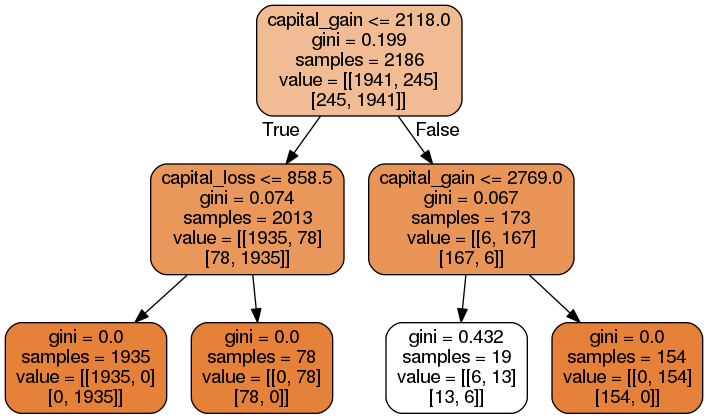

In [14]:
feature_names = X_train.columns
trees = get_trees_from_clusters(clusters)
graph = visualize_tree(trees[0], feature_names)
Image(graph.create_png())

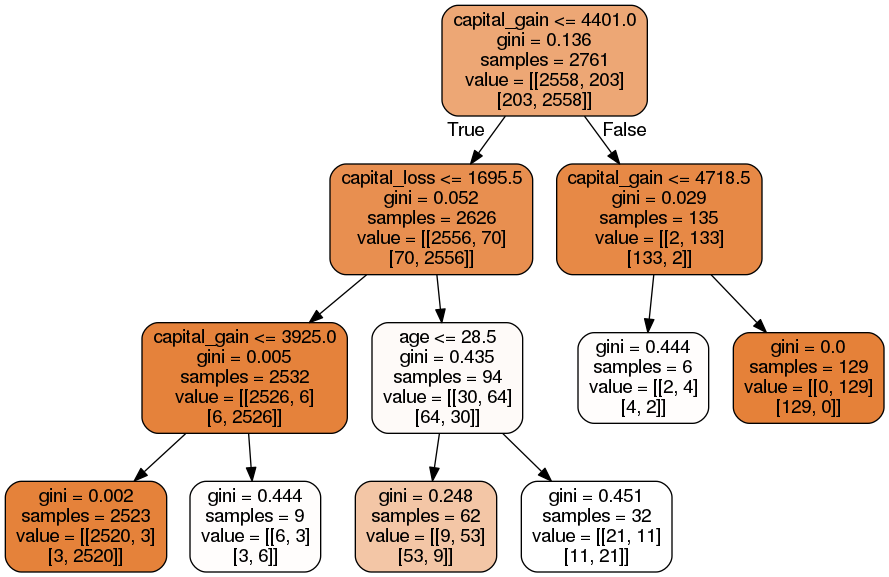

In [44]:
graph = visualize_tree(trees[1], feature_names)
Image(graph.create_png())

In [45]:
from data import *
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


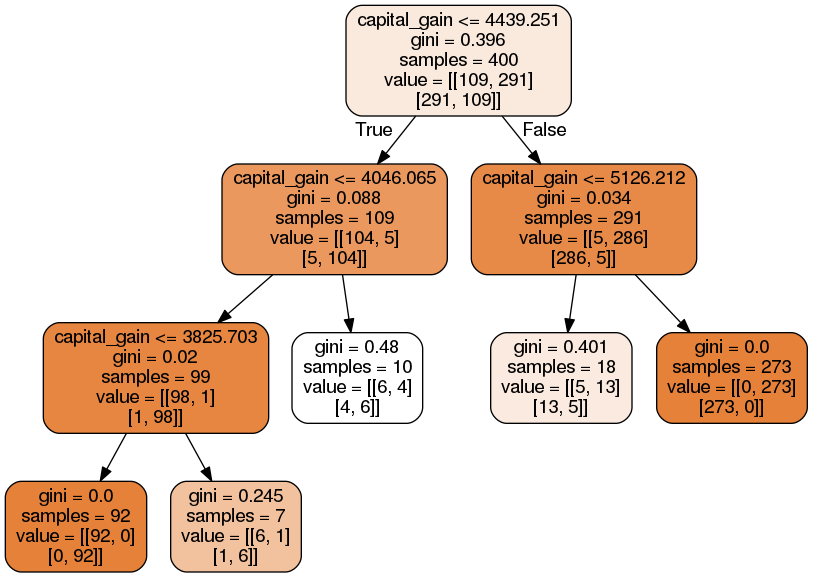

In [46]:
x,y = get_points_around(X[600], predictor, X, samples_size=400)
x = pd.DataFrame(x)
x.columns = X_train.columns
clf = predict_tree(x, y)
feature_names = x.columns
graph = visualize_tree(clf, feature_names)
Image(graph.create_png())

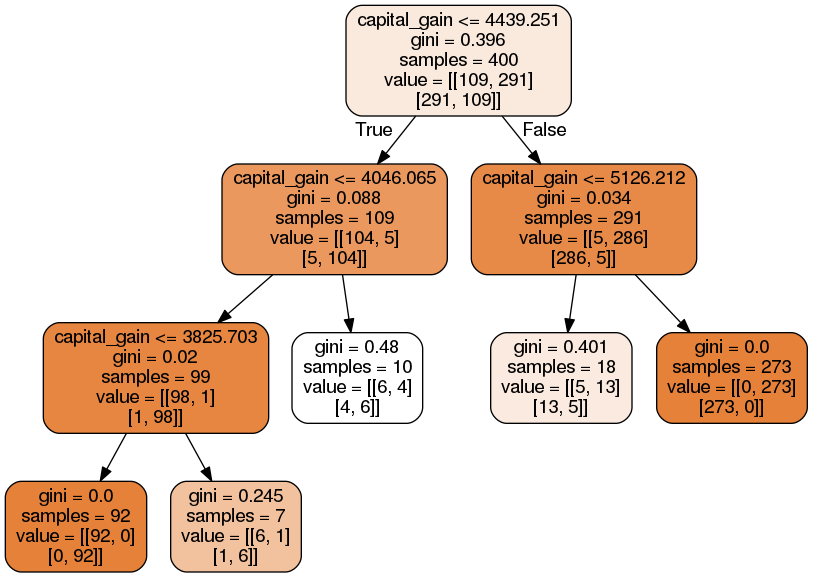

In [47]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=False,
               feature_names=train_data.columns.drop('income'))
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [49]:
for i, w in enumerate(reg.coef_[0]):
    print(i, X_train.columns[i], w)

0 age -0.006925302401090306
1 fnlwgt -3.759537831409531e-06
2 education_num -0.0017030949032218478
3 capital_gain 0.000337474184806134
4 capital_loss 0.0007755823230725231
5 hours_per_week -0.007984496753543768


In [50]:
reg.score(X_train, Y_train)

0.7972138135540866

In [53]:
explainer = lime.lime_tabular.LimeTabularExplainer (np.array(X_train), 
                                                   feature_names=X_train.columns, 
                                                   class_names=["Above 50K", "Below 50K"],
                                                   discretize_continuous=True,
                                                   mode="classification")

In [54]:
def alter(values):
    return np.array([[i, 1-i] for i in values])

def get_linear_lime_predictor(predictor):
    return lambda x: alter(predictor(x))

In [55]:
predictor = get_linear_lime_predictor(reg.predict)

In [56]:
for x in range(10):
    test_explain = np.array(X_test)
    i = np.random.randint(0, test_explain.shape[0])
    print("Current Sample", test_explain[i])
    exp = explainer.explain_instance(test_explain[i], predictor, num_features=4, top_labels=1, num_samples=500)
    exp.show_in_notebook(show_table=True, show_all=False)
    print("----------------------------------------")

Current Sample [2.4000e+01 9.2968e+04 1.4000e+01 0.0000e+00 0.0000e+00 4.0000e+01]


----------------------------------------
Current Sample [1.60000e+01 1.64309e+05 7.00000e+00 0.00000e+00 0.00000e+00 3.00000e+01]


----------------------------------------
Current Sample [2.00000e+01 1.51835e+05 1.30000e+01 0.00000e+00 0.00000e+00 4.00000e+01]


----------------------------------------
Current Sample [1.7000e+01 3.7785e+05 1.0000e+01 0.0000e+00 0.0000e+00 5.0000e+01]


----------------------------------------
Current Sample [4.1000e+01 9.8015e+04 1.6000e+01 1.5024e+04 0.0000e+00 3.2000e+01]


----------------------------------------
Current Sample [1.700e+01 1.929e+05 1.000e+01 0.000e+00 0.000e+00 3.500e+01]


----------------------------------------
Current Sample [3.20000e+01 1.69092e+05 1.00000e+01 5.17800e+03 0.00000e+00 4.00000e+01]


----------------------------------------
Current Sample [2.50000e+01 2.02083e+05 1.10000e+01 0.00000e+00 0.00000e+00 4.00000e+01]


----------------------------------------
Current Sample [1.0000e+01 3.2452e+04 1.4000e+01 0.0000e+00 0.0000e+00 2.0000e+01]


----------------------------------------
Current Sample [1.40000e+01 3.93965e+05 9.00000e+00 0.00000e+00 0.00000e+00 8.00000e+00]


----------------------------------------
